Copyright 2015-2025 Universidad Complutense de Madrid (UCM)

This file contains code adapted from Numina https://github.com/guaix-ucm/numina.

It was developed by N. Cardiel for students of the Astrophysics Master (UCM).

This is an adapted version for lectures at ULS (Chile).

* License:
SPDX-License-Identifier: GPL-3.0+

* Modified by:
C. Cabello (UCM; Spain), 
L. Costantin (CAB; Spain)

## Cosmic ray correction

### Imports

In [1]:
'''
:Settings:
conda activate uls_2025

:History:
23 Mar 25:  version 1.0
'''

import glob
import numpy as np
import teareduce as tea
import matplotlib.pyplot as plt

from pathlib import Path
from astropy.io import fits
from astropy.wcs import WCS
from ccdproc import ImageFileCollection

tea.avoid_astropy_warnings(True)

__version__ = "1.0"
__author__  = "Cristina Cabello (UCM, Spain) and Luca Costantin (CAB, Spain)"


### Read files

In [3]:
galaxy_ID        = 'NGC2366'
specphot_star_ID = 'HR3454'

## MODIFY THE FOLLOWING

abs_path = f'/home/diegosuzaku/NGC2366Workshop'

dir_calibration = Path(f'{abs_path}/calibration/spectroscopy')


In [4]:
list_star   = []
list_target = []

## Select bias, flat, wavelength calibrated images of the target

input_files = sorted(glob.glob(f'{dir_calibration}/wfzt_*.fits'))

for file in input_files:

    with fits.open(file) as hdu:
        k_imagetyp = hdu[0].header['IMAGETYP']
        k_object   = hdu[0].header['OBJECT']
        k_exptime  = hdu[0].header['EXPTIME']

    if (k_imagetyp == 'science' and k_object == specphot_star_ID):

            list_star.append(file)

    if (k_imagetyp == 'science' and k_exptime == 1200.0):

            list_target.append(file)

print(f'Star:     {len(list_star)} files.')
print(f'Target:   {len(list_target)} files.')


Star:     1 files.
Target:   3 files.


In [5]:
selected_keywords = ['NAXIS1', 'NAXIS2', 'OBJECT' ,'IMAGETYP', 'EXPTIME' , 
                     'INSFLID', 'DATE-OBS', 'FILTER']

ifc_star = ImageFileCollection(location=f'{dir_calibration}',
                               filenames=list_star,
                               keywords=selected_keywords)

summary_star = tea.ifc_statsummary(ifc_star, dir_calibration)
summary_star.show_in_notebook()

  0%|          | 0/1 [00:00<?, ?it/s]

/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/traitlets/__init__.py:28: DeprecationWarning: 
            Sentinel is not a public part of the traitlets API.
            It was published by mistake, and may be removed in the future.
            
  warn(
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/traittypes/traittypes.py:188: DeprecationWarning: metadata {'dtype': None} was set from the constructor. With traitlets 4.1, metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  super(DataFrame, self).__init__(


DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

In [6]:
ifc_target = ImageFileCollection(location=f'{dir_calibration}',
                                 filenames=list_target,
                                 keywords=selected_keywords)

summary_target = tea.ifc_statsummary(ifc_target, dir_calibration)
summary_target.show_in_notebook()

  0%|          | 0/3 [00:00<?, ?it/s]

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

In [7]:
list_data = []

for filename in list_target:
    data = fits.getdata(dir_calibration / filename)
    list_data.append(data)

Display images and zoom to look for possible offsets.

In [8]:
# coordinates of the source to be used to determine image offsets
xcenter, ycenter = 1015, 480

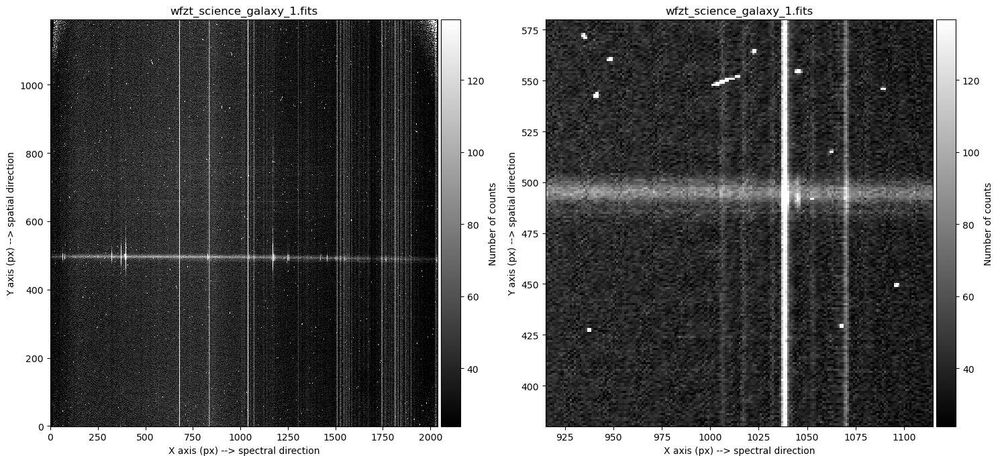

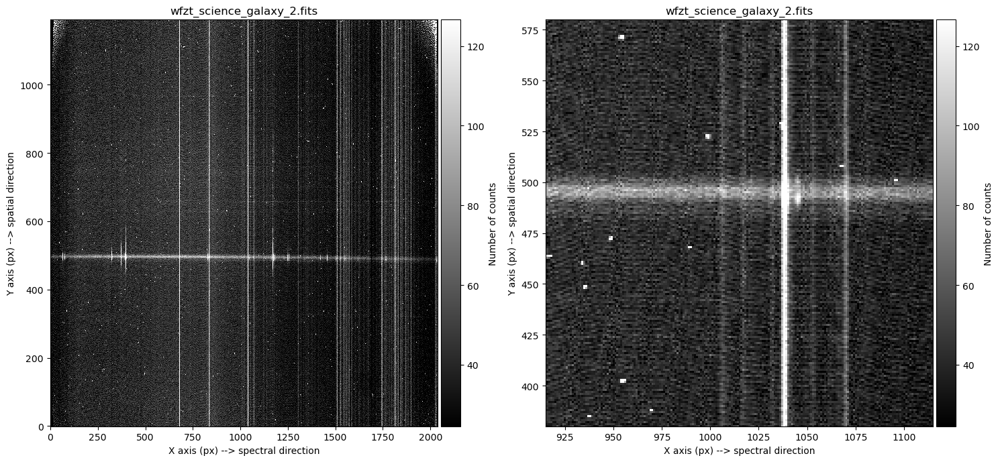

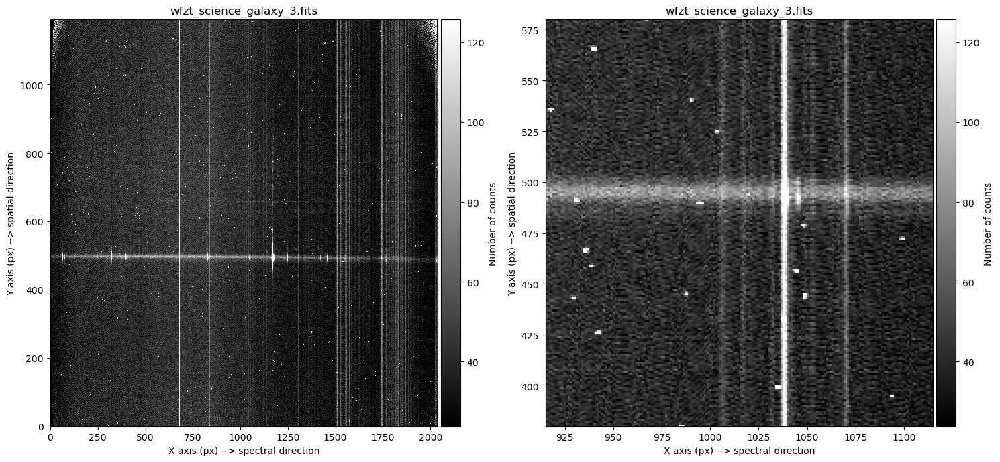

In [9]:
for filename, data in zip(list_target, list_data):
    vmin, vmax = np.percentile(data, [10, 99.5])
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
    tea.imshow(fig, ax1, data, vmin=vmin, vmax=vmax, cmap='gray', aspect='auto', title=f"{filename.split('/')[-1]}")
    tea.imshow(fig, ax2, data, vmin=vmin, vmax=vmax, cmap='gray', aspect='auto', title=f"{filename.split('/')[-1]}")
    ax2.set_xlim(xcenter - 100, xcenter + 100)
    ax2.set_ylim(ycenter - 100, ycenter + 100)
    ax1.set_xlabel('X axis (px) --> spectral direction')
    ax1.set_ylabel('Y axis (px) --> spatial direction')
    ax2.set_xlabel('X axis (px) --> spectral direction')
    ax2.set_ylabel('Y axis (px) --> spatial direction')
    plt.tight_layout()

### Cosmic ray correction with tea.cr2images

In [10]:
print(tea.cr2images.__doc__)

Remove cosmic rays from differences between 2 images.

    The input images must have the same shape. If only 1 image
    is available, this function computes a second image by
    applying a median filter to the first image.

    Parameters
    ----------
    data1 : numpy array
        First image
    data2 : numpy array
        Second image. If None, a median filtered version of 'data1'
        is employed. In this case, the parameter 'median_size' must
        be properly set.
    ioffx : int
        Integer offset (pixels) to place the second image on top of
        the first image in the horizontal direction (axis=1) in the
        numpy array.
    ioffy : int
        Integer offset (pixels) to place the second image on top of
        the first image in the vertical direction (axis=0) in the
        numpy array.
    tsigma_peak : float
        Times sigma to detect cosmic ray peaks
    tsigma_tail : float
        Times sigma to detect additional pixels affected by cosmic
        

#### Spectro-photometric star

In [11]:
data_star = fits.getdata(dir_calibration / list_star[0])


Computing overlaping rectangle:
ioffx: 0
ioffx: 0
data1:  i1,  i2,  j1,  j2: 0, 1191, 0, 2039
data2: ii1, ii2, jj1, jj2: 0, 1191, 0, 2039
shape1: (1191, 2039), shape2: (1191, 2039), shape(diff): (1191, 2039)

>>> Statistical summary of diff = overlapping data1 - data2:
>>> Median....: 0.000
>>> Robust_std: 4.786
Number of CR in data1: 590 peaks, 22955 tails


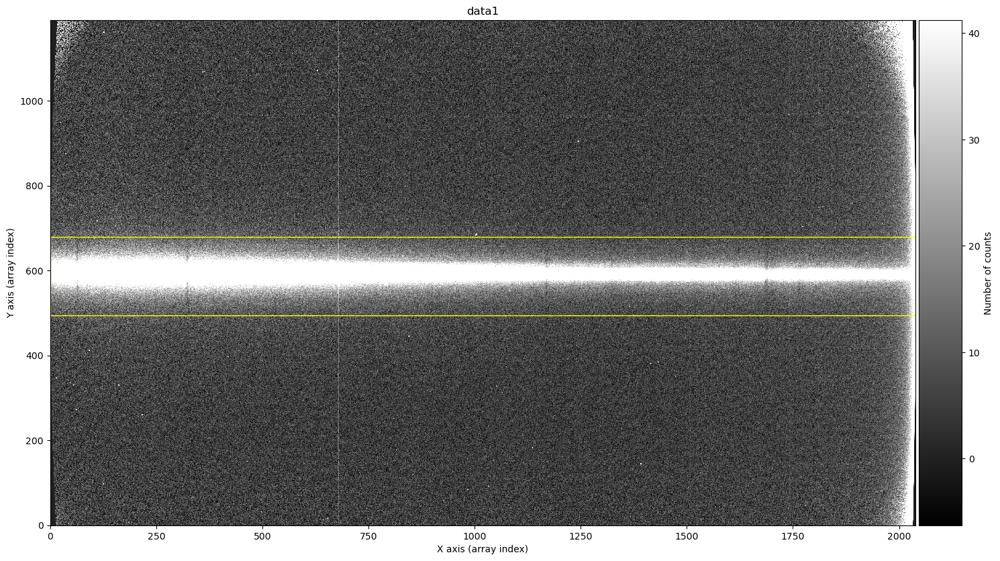

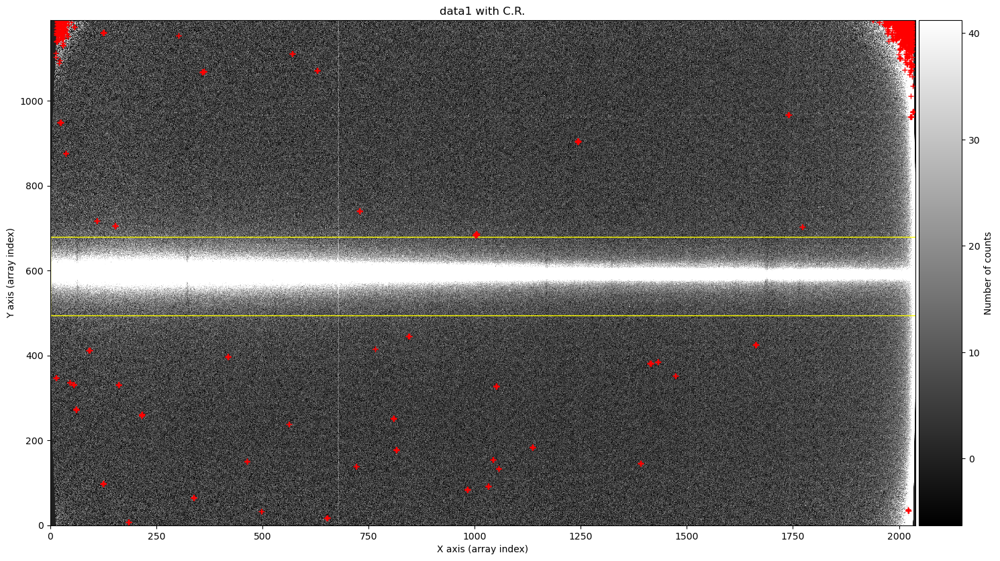

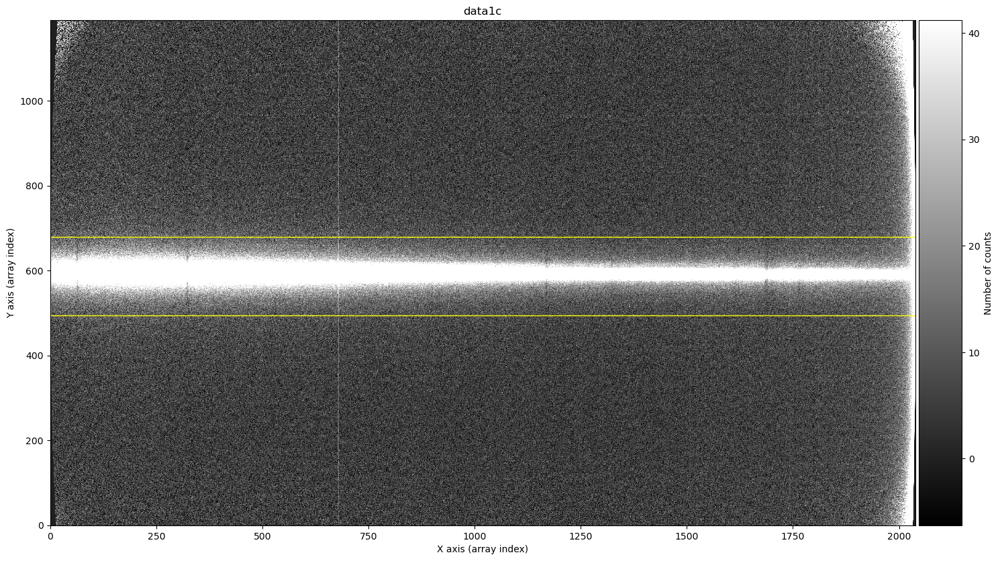

In [12]:
list_skipped_regions = [tea.SliceRegion2D(np.s_[1:2050, 495:680], mode='fits')]

median_size = (9, 1)

data_sc = tea.cr2images(data1=data_star,
                        median_size = median_size,
                        list_skipped_regions=list_skipped_regions,
                        debug_level=1)


### Save results to file

#### Spectro-photometric star

In [13]:
header_star = fits.getheader(dir_calibration / f'wfzt_science_star.fits')

output_filename = dir_calibration / f'cwfzt_{specphot_star_ID}.fits'

hdu = fits.PrimaryHDU(data=data_sc[0], header=header_star)

hdu.writeto(dir_calibration / output_filename, overwrite=True)

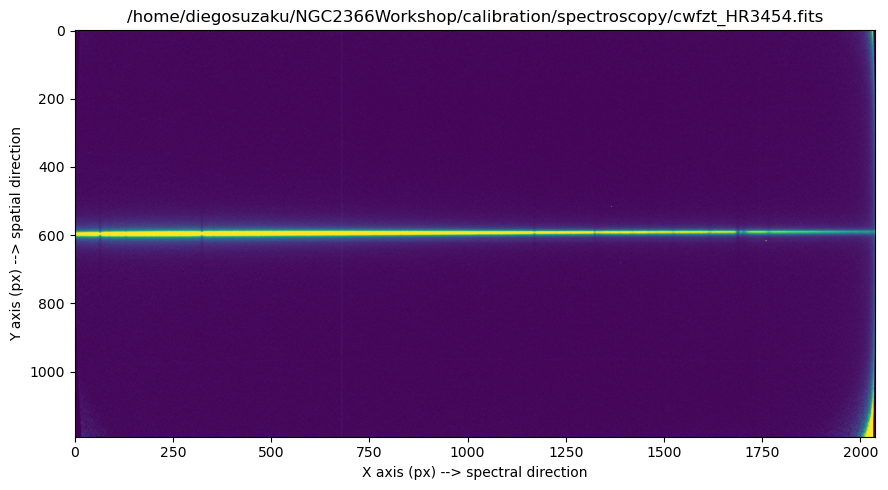

In [14]:
data = fits.getdata(dir_calibration / output_filename)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9, 5))

ax.imshow(data_sc[0], cmap='viridis', aspect='auto', vmin=0, vmax=300)

ax.set_title(f'{output_filename}')
ax.set_xlabel('X axis (px) --> spectral direction')
ax.set_ylabel('Y axis (px) --> spatial direction')

plt.tight_layout()

#### Galaxy

Check that the galaxies are not shifted and trim the frames in that case.

Combine frames to remove cosmic rays.

In [15]:
combination = np.median((list_data[0],list_data[1],list_data[2]), axis=0)

header_galaxy = fits.getheader(dir_calibration / f'wfzt_science_galaxy_1.fits')

output_filename = f'combined_{galaxy_ID}.fits'

hdu = fits.PrimaryHDU(data=combination, header=header_galaxy)

hdu.writeto(dir_calibration / output_filename, overwrite=True)

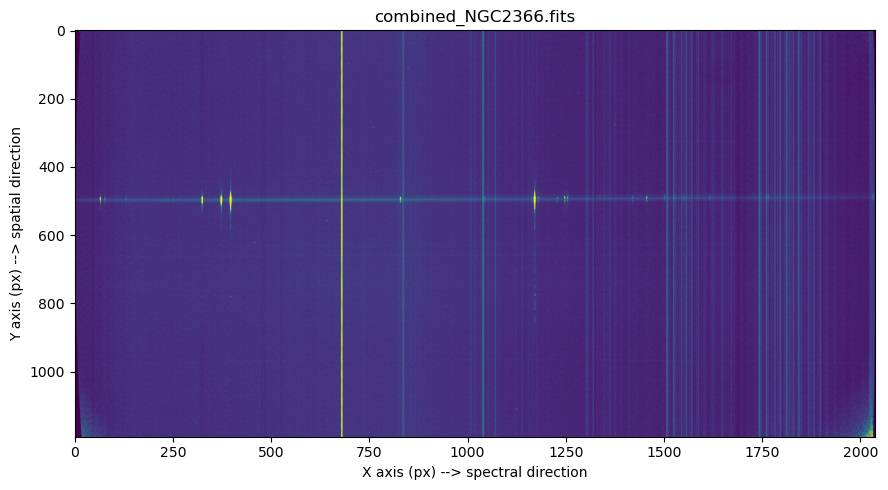

In [16]:
data = fits.getdata(dir_calibration / output_filename)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9, 5))

ax.imshow(data, cmap='viridis', aspect='auto', vmin=0, vmax=300)

ax.set_title(f'{output_filename}')
ax.set_xlabel('X axis (px) --> spectral direction')
ax.set_ylabel('Y axis (px) --> spatial direction')

plt.tight_layout()